# 라이브러리 임포트 및 함수 정의

In [ ]:
import os
import json
import glob
import numpy as np
import pandas as pd
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
BASE_DIR = 'workspace/AI/FER/Data/EST_data'
IMG_SPLITS = ['img_train', 'img_val', 'img_test']
SEG_SPLITS = ['seg_train', 'seg_val', 'seg_test']
LABEL_SPLITS = ['label_train', 'label_val', 'label_test']
CLASSES = ['anger', 'happy', 'panic', 'sadness']

# 세그멘테이션 클래스 매핑 (첨부 설명 기준)
SEG_CLASS_MAP = {
    0: 'background',
    1: 'hair',
    2: 'body',
    3: 'face',
    4: 'cloth',
    5: 'etc'
}
# 시각화용 컬러맵 (RGBA, 0~255)
SEG_COLORS = {
    0: (0, 0, 0, 0),          # transparent for background overlay
    1: (255, 215, 0, 100),    # hair - gold
    2: (135, 206, 235, 100),  # body - skyblue
    3: (255, 0, 0, 100),      # face - red
    4: (0, 255, 0, 100),      # cloth - green
    5: (128, 0, 128, 100),    # etc - purple
}

# 라벨 JSON 포맷 키 매핑 (필요 시 이름 맞게 변경하세요)
# JSON 구성 - [{filename, gender, age, isProf, faceExp_uploader, bg_uploader, annot_A:{boxes:{minX,maxX,minY,maxY},faceExp,bg}, annot_B:{...}, annot_C:{...}}, ...]
ANNOTATOR_KEYS = ['annot_A', 'annot_B', 'annot_C']
BOX_KEYS = ['minX', 'maxX', 'minY', 'maxY']

In [3]:
# 유틸 함수 1 - 이미지, 레이블, 세그먼트 목록 가져오기

def list_images(split_dir):
    paths = []
    for cls in CLASSES:
        cls_dir = os.path.join(BASE_DIR, split_dir, cls)
        if os.path.isdir(cls_dir):
            images = [os.path.join(cls_dir, f) for f in os.listdir(cls_dir) if f.lower().endswith(('.jpg', '.jpeg'))]
            paths.extend(images)
    return paths

def list_label_jsons(label_split):
    label_dir = os.path.join(BASE_DIR, label_split)
    jsons = glob.glob(os.path.join(label_dir, '*.json'))
    return jsons

def list_segmentations(seg_split):
    seg_dir = os.path.join(BASE_DIR, seg_split)
    segs = glob.glob(os.path.join(seg_dir, '*.npz'))
    return segs

In [4]:
# 유틸 함수 2 - json 분리
def load_all_label_records(label_split):
    """label_split 내부의 모든 json을 로드하여 레코드 리스트 반환"""
    json_files = list_label_jsons(label_split)
    records = []
    for jf in json_files:
        with open(jf, 'r', encoding='euc-kr') as f:
            try:
                data = json.load(f)
            except Exception as e:
                print(f'JSON load error: {jf} -> {e}')
                continue
        # data는 list라 가정
        for item in data:
            records.append(item)
    return records

def long_format_from_records(records, split_name):
    """annotator 단위로 long-form DataFrame 구성"""
    rows = []
    for item in records:
        # 필수 키 존재 여부 확인 (유연성 위해 get 사용)
        filename = item.get('filename')
        gender = item.get('gender')
        age = item.get('age')
        isProf = item.get('isProf')
        faceExp_uploader = item.get('faceExp_uploader')
        bg_uploader = item.get('bg_uploader')

        for annot_key in ANNOTATOR_KEYS:
            ann = item.get(annot_key, {})
            boxes = ann.get('boxes', {})
            row = {
                'split': split_name,
                'filename': filename,
                'gender': gender,
                'age': age,
                'isProf': isProf,
                'uploader_faceExp': faceExp_uploader,
                'uploader_bg': bg_uploader,
                'annotator': annot_key,
                'faceExp': ann.get('faceExp'),
                'bg': ann.get('bg'),
                'minX': boxes.get('minX'),
                'maxX': boxes.get('maxX'),
                'minY': boxes.get('minY'),
                'maxY': boxes.get('maxY'),
            }
            rows.append(row)
    return pd.DataFrame(rows)

In [5]:
def find_image_path(filename):
    """filename으로 img_train/val/test 하위에서 검색"""
    for split in IMG_SPLITS:
        for cls in CLASSES:
            path = os.path.join(BASE_DIR, split, cls, filename)
            if os.path.isfile(path):
                return path
    # 파일명이 폴더 포함일 수 있음
    for split in IMG_SPLITS:
        cand = os.path.join(BASE_DIR, split, filename)
        if os.path.isfile(cand):
            return cand
    return None

def find_seg_path(filename, seg_split):
    """세그 npz 파일 찾기"""
    stem = os.path.splitext(os.path.basename(filename))[0]
    seg_dir = os.path.join(BASE_DIR, seg_split)
    cand = os.path.join(seg_dir, f'{stem}.npz')
    return cand if os.path.isfile(cand) else None

def load_seg_mask(npz_path, filename):
    """
    npz 내부에서 주어진 filename(key)에 해당하는 segmentation mask를 반환.
    filename은 실제 key로(파일명), 예: '04b68c3....jpg'
    """
    with np.load(npz_path) as npz:
        if filename in npz.files:
            arr = npz[filename]
        else:
            raise KeyError(f"Key {filename} not found in {npz_path}")
    return arr

In [6]:
def draw_bbox_on_image(img, bbox, color=(255, 0, 0), width=3):
    draw = ImageDraw.Draw(img)
    x0, y0, x1, y1 = bbox
    draw.rectangle([x0, y0, x1, y1], outline=color, width=width)
    return img

def overlay_segmentation(img, seg_mask):
    """RGBA overlay 생성 후 원본에 겹침"""
    if img.mode != 'RGBA':
        img = img.convert('RGBA')
    overlay = Image.new('RGBA', img.size, (0, 0, 0, 0))
    overlay_pixels = overlay.load()
    w, h = img.size

    # seg_mask 크기가 이미지와 다를 수 있음 -> resize(NEAREST)
    if seg_mask.shape[1] != w or seg_mask.shape[0] != h:
        from PIL import Image as PILImage
        seg_img = PILImage.fromarray(seg_mask.astype(np.uint8))
        seg_img = seg_img.resize((w, h), resample=PILImage.NEAREST)
        seg_mask = np.array(seg_img)

    for y in range(h):
        for x in range(w):
            cls_id = int(seg_mask[y, x])
            color = SEG_COLORS.get(cls_id, (255, 255, 255, 60))
            if cls_id != 0:
                overlay_pixels[x, y] = color
    blended = Image.alpha_composite(img, overlay)
    return blended

def bbox_size_and_ratio(minX, maxX, minY, maxY, img_w=None, img_h=None):
    try:
        w = max(0, float(maxX) - float(minX))
        h = max(0, float(maxY) - float(minY))
        area = w * h
        aspect = (w / h) if h > 0 else np.nan
        # 이미지 대비 비율
        rel_area = (area / (img_w * img_h)) if (img_w and img_h and img_w*img_h>0) else np.nan
        return w, h, area, aspect, rel_area
    except:
        return np.nan, np.nan, np.nan, np.nan, np.nan

def compute_seg_ratios(seg_mask):
    total = seg_mask.size
    ratios = {}
    for k, name in SEG_CLASS_MAP.items():
        ratios[name] = float(np.sum(seg_mask == k)) / total if total > 0 else np.nan
    return ratios

# (A) 기본 통계 분석

## -1. 이미지 개수 분포

In [7]:
img_counts = []
for split in IMG_SPLITS:
    for cls in CLASSES:
        dir_path = os.path.join(BASE_DIR, split, cls)
        cnt = len([f for f in glob.glob(os.path.join(dir_path, '*')) if os.path.isfile(f)])
        img_counts.append({'split': split, 'class': cls, 'count': cnt})
img_counts_df = pd.DataFrame(img_counts)
print('\n[이미지 개수 분포]')
print(img_counts_df.pivot(index='class', columns='split', values='count').fillna(0).astype(int))


[이미지 개수 분포]
split    img_test  img_train  img_val
class                                
anger         300       1500      300
happy         300       1495      300
panic         300       1501      300
sadness       300       1500      300


## -2. segment 및 json 라벨 파일 수

In [8]:
seg_counts = []
for seg_split in SEG_SPLITS:
    cnt = len(list_segmentations(seg_split))
    seg_counts.append({'seg_split': seg_split, 'count': cnt})
seg_counts_df = pd.DataFrame(seg_counts)
print('\n[Segmentation 파일 수]')
print(seg_counts_df)

label_counts = []
for label_split in LABEL_SPLITS:
    jsons = list_label_jsons(label_split)
    label_counts.append({'label_split': label_split, 'json_files': len(jsons)})
label_counts_df = pd.DataFrame(label_counts)
print('\n[JSON 라벨 파일 수]')
print(label_counts_df)


[Segmentation 파일 수]
   seg_split  count
0  seg_train      4
1    seg_val      4
2   seg_test      4

[JSON 라벨 파일 수]
   label_split  json_files
0  label_train           4
1    label_val           4
2   label_test           4


## -3. (중요) 라벨 레코드 샘플 확인 및 전체 라벨 데이터를 하나의 데이터프레임으로 합치기

In [9]:
# 모든 라벨(split) 폴더의 JSON 파일을 불러와서 annotator별 long-form 데이터프레임으로 변환
# 전체 라벨 데이터를 하나의 데이터프레임(label_long_df)으로 합침
# 샘플 데이터를 출력하여 라벨 구조 확인
label_long_list = []
for lbl_split in LABEL_SPLITS:
    recs = load_all_label_records(lbl_split)
    df_long = long_format_from_records(recs, lbl_split)
    label_long_list.append(df_long)
label_long_df = pd.concat(label_long_list, ignore_index=True) if label_long_list else pd.DataFrame()
print('\n[라벨 레코드 샘플]. 3개 단위로 한 이미지 파일에 대한 라벨링')
print(label_long_df.head(6))


[라벨 레코드 샘플]. 3개 단위로 한 이미지 파일에 대한 라벨링
         split                                           filename gender  age  \
0  label_train  6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63...      남   30   
1  label_train  6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63...      남   30   
2  label_train  6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63...      남   30   
3  label_train  65rsfe402042f34319e10128c1ab9614e2f967690a64a0...      남   40   
4  label_train  65rsfe402042f34319e10128c1ab9614e2f967690a64a0...      남   40   
5  label_train  65rsfe402042f34319e10128c1ab9614e2f967690a64a0...      남   40   

  isProf uploader_faceExp        uploader_bg annotator faceExp  \
0    일반인               분노  교통/이동수단(엘리베이터 포함)   annot_A      분노   
1    일반인               분노  교통/이동수단(엘리베이터 포함)   annot_B      분노   
2    일반인               분노  교통/이동수단(엘리베이터 포함)   annot_C      분노   
3    전문인               분노          문화재 및 유적지   annot_A      분노   
4    전문인               분노          문화재 및 유적지   annot_B      분노  

## -4. 인물 성별/연령대/직업군 분포 확인 (전체 / 업로더 분류 감정별)

In [10]:
if not label_long_df.empty:
    person_df = label_long_df.drop_duplicates(subset=['split','filename'])[['split','filename','gender','age','isProf']]

    print('\n[전체 성별 분포]')
    print(person_df['gender'].value_counts(dropna=False))

    print('\n[전체 연령대 분포]')
    print(person_df['age'].value_counts(dropna=False))

    print('\n[전체 직업군(isProf) 분포]')
    print(person_df['isProf'].value_counts(dropna=False))


[전체 성별 분포]
gender
여    4558
남    3836
Name: count, dtype: int64

[전체 연령대 분포]
age
20    4208
30    2893
40     963
50     217
10      98
60      15
Name: count, dtype: int64

[전체 직업군(isProf) 분포]
isProf
일반인    4417
전문인    3977
Name: count, dtype: int64


In [11]:
if not label_long_df.empty:
    # 감정 카테고리별 속성 분포 비교: 업로더 감정 기준
    if 'uploader_faceExp' in label_long_df.columns:
        per_img = label_long_df.drop_duplicates(subset=['split','filename'])[['split','filename','uploader_faceExp','gender','age','isProf']]
        print('\n[감정(업로더)별 성별/연령/직업 분포]')
        print(per_img.groupby(['uploader_faceExp'])[['gender','age','isProf']].agg(lambda x: x.value_counts().head(6).to_dict()))


[감정(업로더)별 성별/연령/직업 분포]
                                 gender  \
uploader_faceExp                          
기쁨                {'여': 1140, '남': 954}   
당황                {'여': 1127, '남': 973}   
분노                {'여': 1131, '남': 969}   
슬픔                {'여': 1160, '남': 940}   

                                                                age  \
uploader_faceExp                                                      
기쁨                {20: 1047, 30: 743, 40: 207, 50: 61, 10: 27, 6...   
당황                     {20: 1067, 30: 706, 40: 250, 50: 57, 10: 20}   
분노                {20: 1049, 30: 745, 40: 236, 50: 43, 10: 23, 6...   
슬픔                {20: 1045, 30: 699, 40: 270, 50: 56, 10: 28, 6...   

                                      isProf  
uploader_faceExp                              
기쁨                 {'일반인': 1135, '전문인': 959}  
당황                {'일반인': 1090, '전문인': 1010}  
분노                {'일반인': 1055, '전문인': 1045}  
슬픔                 {'일반인': 1137, '전문인': 963}  


## -5. (중요) 업로더가 설정한 감정과 라벨러 3명이 설정한 감정이 똑같은 파일들의 갯수

In [12]:
if not label_long_df.empty and 'uploader_faceExp' in label_long_df.columns:
    # 파일별로 업로더 감정과 annotator 감정이 모두 일치하는지 확인
    match_files = []
    for (split, filename), group in label_long_df.groupby(['split', 'filename']):
        annot_faces = group['faceExp'].dropna().tolist()
        uploader_face = group['uploader_faceExp'].iloc[0] if 'uploader_faceExp' in group.columns else None
        # annotator가 3명이고 모두 업로더와 감정이 같을 때
        if len(annot_faces) == 3 and all(face == uploader_face for face in annot_faces):
            match_files.append({'split': split, 'filename': filename, 'emotion': uploader_face})

    match_df = pd.DataFrame(match_files)
    print(f"\n업로더와 3명의 라벨러 감정이 모두 일치하는 파일 수: {len(match_df)}")
    print("\n감정별 일치 파일 수:")
    print(match_df['emotion'].value_counts())


업로더와 3명의 라벨러 감정이 모두 일치하는 파일 수: 4959

감정별 일치 파일 수:
emotion
기쁨    1958
분노    1019
당황    1006
슬픔     976
Name: count, dtype: int64


In [13]:
total_files = len(label_long_df.drop_duplicates(subset=['split', 'filename']))
match_total = len(match_df)
print(f"전체: {total_files}장 중 {match_total}장 - {match_total/total_files*100:.2f}%")

for emo in match_df['emotion'].unique():
    total_emo = len(label_long_df[label_long_df['uploader_faceExp'] == emo].drop_duplicates(subset=['split', 'filename']))
    match_emo = match_df['emotion'].value_counts()[emo]
    print(f"{emo}: {total_emo}장 중 {match_emo}장 - {match_emo/total_emo*100:.2f}%")

전체: 8394장 중 4959장 - 59.08%
슬픔: 2100장 중 976장 - 46.48%
당황: 2100장 중 1006장 - 47.90%
분노: 2100장 중 1019장 - 48.52%
기쁨: 2094장 중 1958장 - 93.51%


## -6. 일치하는 파일 중, 전문인 비율 확인

In [14]:
# match_df에는 일치하는 파일 정보가 있음
# label_long_df에서 split, filename 기준으로 isProf 정보 추출 (중복 제거)
prof_df = label_long_df.drop_duplicates(subset=['split', 'filename'])[['split', 'filename', 'isProf']]

# match_df와 prof_df를 merge
merged = pd.merge(match_df, prof_df, on=['split', 'filename'], how='left')
merged['isProf_num'] = merged['isProf'].apply(lambda x: 1 if str(x).strip() in ['1', 'True', '전문인'] else 0)

# 전문인(isProf==1 또는 True) 비율 계산
total = len(merged)
prof_count = merged['isProf_num'].sum()  # isProf가 1 또는 True일 때
print(f"전문인 비율: {prof_count} / {total} = {prof_count/total*100:.2f}%")
# print(prof_count, total)

전문인 비율: 2193 / 4959 = 44.22%


## -7. 업로더가 설정한 감정과 라벨러 3명이 설정한 감정이 똑같은 파일들 5개 랜덤 출력

In [15]:
import random
import matplotlib.pyplot as plt
from PIL import Image, ExifTags

def correct_image_orientation(img):
    try:
        exif = img._getexif()
        if exif is not None:
            for tag, value in exif.items():
                if ExifTags.TAGS.get(tag, None) == 'Orientation':
                    if value == 1:
                        pass  # 정상
                    elif value == 2:
                        img = img.transpose(Image.FLIP_LEFT_RIGHT)
                    elif value == 3:
                        img = img.rotate(180, expand=True)
                    elif value == 4:
                        img = img.transpose(Image.FLIP_TOP_BOTTOM)
                    elif value == 5:
                        img = img.transpose(Image.FLIP_LEFT_RIGHT).rotate(-90, expand=True)
                    elif value == 6:
                        img = img.rotate(-90, expand=True)
                    elif value == 7:
                        img = img.transpose(Image.FLIP_LEFT_RIGHT).rotate(90, expand=True)
                    elif value == 8:
                        img = img.rotate(90, expand=True)
    except Exception:
        pass
    return img

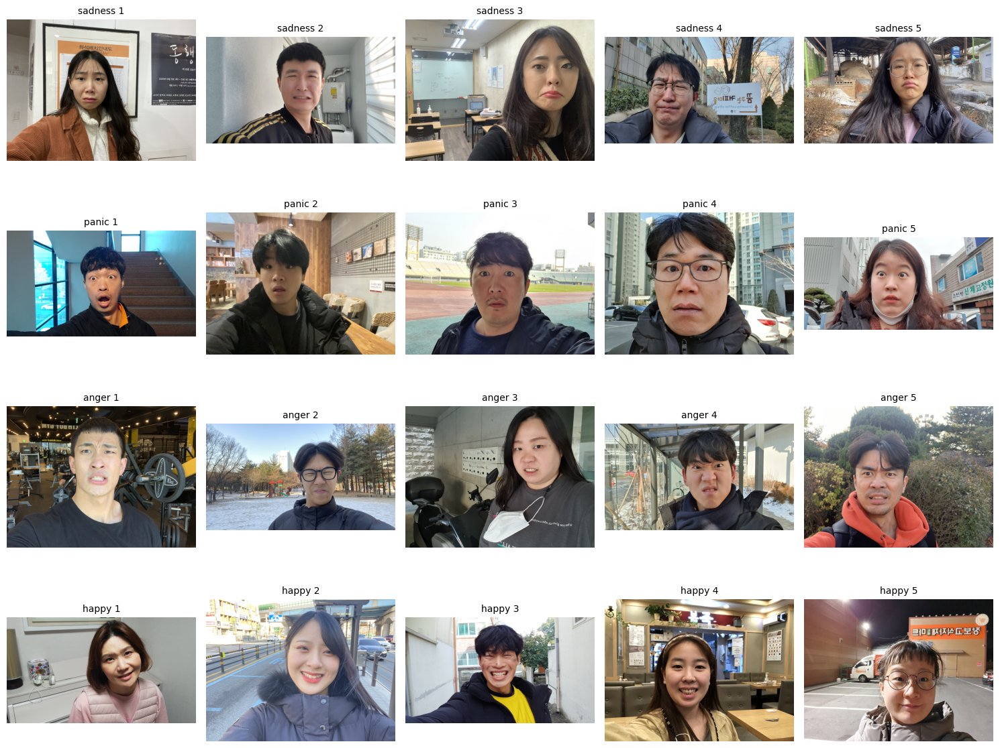

In [16]:
random.seed(7910)
# 한글 감정명을 영어로 매핑
emotion_map = {
    '기쁨': 'happy',
    '분노': 'anger',
    '당황': 'panic',
    '슬픔': 'sadness'
}

if not label_long_df.empty and 'uploader_faceExp' in label_long_df.columns:
    # 일치하는 파일 추출
    match_files = []
    for (split, filename), group in label_long_df.groupby(['split', 'filename']):
        annot_faces = group['faceExp'].dropna().tolist()
        uploader_face = group['uploader_faceExp'].iloc[0] if 'uploader_faceExp' in group.columns else None
        if len(annot_faces) == 3 and all(face == uploader_face for face in annot_faces):
            match_files.append({'split': split, 'filename': filename, 'emotion': uploader_face})

    match_df = pd.DataFrame(match_files)
    emotions = match_df['emotion'].unique()
    sample_imgs = []

    for emo in emotions:
        files = match_df[match_df['emotion'] == emo]['filename'].tolist()
        if len(files) >= 5:
            selected = random.sample(files, 5)
        else:
            selected = files
        for fname in selected:
            img_path = find_image_path(fname)
            sample_imgs.append({'emotion': emo, 'img_path': img_path})

    n = len(sample_imgs)
    ncols = 5
    nrows = (n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 3 * nrows))
    axes = axes.ravel()

    # 감정별로 번호 붙이기 위한 인덱스 관리
    emo_count = {emo: 0 for emo in emotions}

    for i, sample in enumerate(sample_imgs):
        ax = axes[i]
        if sample['img_path'] and os.path.isfile(sample['img_path']):
            img = Image.open(sample['img_path'])
            img = correct_image_orientation(img) # exif 정보를 읽어 이미지 자동 변환
            img = img.convert('RGB') # (optional)?
            ax.imshow(img)
            emo = sample['emotion']
            emo_count[emo] += 1
            eng_emo = emotion_map.get(emo, emo) # 한글감정 -> 영어
            ax.set_title(f"{eng_emo} {emo_count[emo]}", fontsize=10)
        else:
            ax.set_title(f"Missing", fontsize=8)
        ax.axis('off')

    for ax in axes[n:]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

## - 추가. exif 정보 확인 및 회전

{322: 512, 323: 512, 34853: {1: 'N', 2: (35.0, 10.0, 5.21), 3: 'E', 4: (129.0, 8.0, 23.34), 5: b'\x00', 6: 19.20562347188264, 12: 'K', 13: 0.1160059773847765, 16: 'T', 17: 328.10807414388944, 23: 'T', 24: 148.1080740117746, 31: 14.191997107388213}, 296: 2, 34665: 250, 271: 'Apple', 272: 'iPhone 11', 305: '14.3', 274: 4, 306: '2021:02:04 13:25:27', 531: 1, 282: 72.0, 283: 72.0, 316: 'iPhone 11', 36864: b'0232', 37121: b'\x01\x02\x03\x00', 37377: 6.92576860841424, 36867: '2021:02:04 13:25:27', 36868: '2021:02:04 13:25:27', 37378: 2.2750070478484843, 37379: 5.816857196401799, 37380: 0.0, 37383: 3, 37385: 16, 37386: 2.71, 40961: 65535, 40962: 3088, 41989: 30, 41990: 0, 36880: '+09:00', 36881: '+09:00', 36882: '+09:00', 37521: '457', 37522: '457', 40963: 2316, 41495: 2, 33434: 0.00819672131147541, 33437: 2.2, 41729: b'\x01', 34850: 2, 34855: 50, 41986: 0, 40960: b'0100', 41987: 0, 42034: (2.7100000381578897, 2.7100000381578897, 2.2, 2.2), 42035: 'Apple', 42036: 'iPhone 11 front camera 2.71m

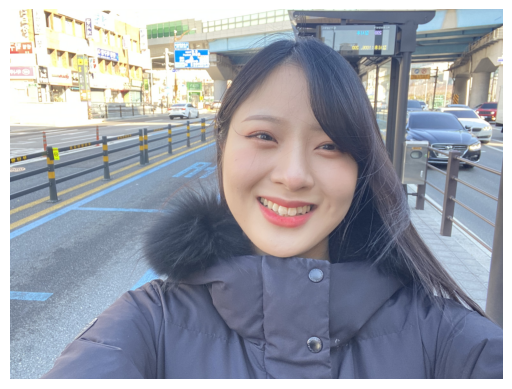

In [17]:
# EXIF Orientation(274): 4
img = Image.open('./Data/EST_data/img_train/happy/hr9yae85688bb1f4fbefef5edb9b58d59fa9e70f65f86e0892eff96b6f9ff32v9.jpg')
print(img._getexif())
img = correct_image_orientation(img)
plt.imshow(img)
plt.axis('off')
plt.show()

{34853: {1: 'N', 2: (35.0, 11.0, 44.69), 3: 'E', 4: (129.0, 4.0, 11.15), 5: b'\x00', 6: 11.718453188602442, 12: 'K', 13: 0.9567849633964081, 16: 'T', 17: 250.66314677930305, 23: 'T', 24: 70.6631469979296, 31: 21.38911095796003}, 296: 2, 34665: 204, 271: 'Apple', 272: 'iPhone XR', 305: '14.1', 274: 3, 306: '2020:11:16 13:38:05', 531: 1, 282: 72.0, 283: 72.0, 36864: b'0231', 37121: b'\x01\x02\x03\x00', 37377: 5.908334013549914, 36867: '2020:11:16 13:38:05', 36868: '2020:11:16 13:38:05', 37378: 2.2750070476914215, 37379: 4.064623669701244, 37380: 0.0, 37383: 5, 37385: 24, 37386: 2.87, 40961: 65535, 40962: 3088, 41989: 32, 41990: 0, 36880: '+09:00', 36881: '+09:00', 36882: '+09:00', 37521: '410', 37522: '410', 40963: 2316, 41495: 2, 33434: 0.016666666666666666, 33437: 2.2, 41729: b'\x01', 34850: 2, 34855: 80, 41986: 0, 40960: b'0100', 41987: 0, 42034: (2.8699998854826334, 2.8699998854826334, 2.2, 2.2), 42035: 'Apple', 42036: 'iPhone XR front camera 2.87mm f/2.2', 42080: 2, 37500: b'Apple i

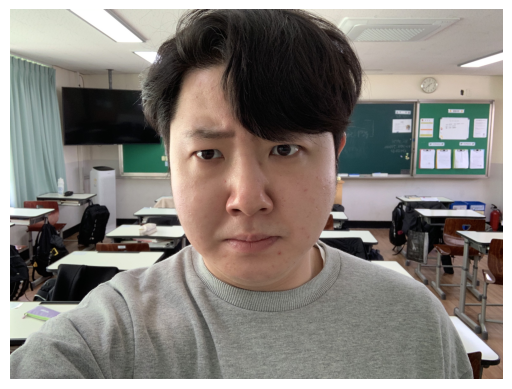

In [18]:
# EXIF Orientation(274): 3
img = Image.open('./Data/EST_data/img_train/anger/03nf73f4eb25c42388b21c54304c809be3fed9c8815eb252603b90def95e3b41o.jpg')
print(img._getexif()) 
img = correct_image_orientation(img)
plt.imshow(img)
plt.axis('off')
plt.show()

{256: 3216, 257: 1808, 34853: {1: '', 2: (0.0, 0.0, 0.0), 3: '', 4: (0.0, 0.0, 0.0)}, 34665: 147, 271: 'samsung', 272: 'SM-N971N', 274: 3, 306: '2021:01:16 15:19:30', 37378: 2.27, 41987: 0, 34855: 50, 33434: 0.0028, 37384: 0, 37385: 0, 37386: 3.25}


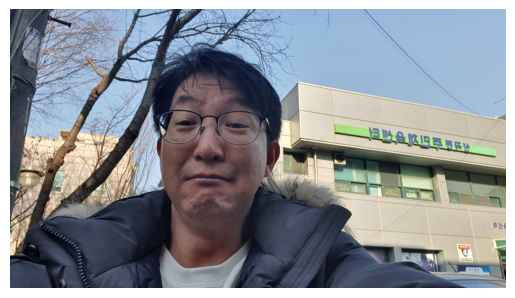

In [19]:
#  ./EST_data/img_train/sadness/887j5e59c505c555b892c184dd258555c910ea327819094d3793b2ef550d0vmnq.jpg
# EXIF Orientation(274): 3
img = Image.open('./Data/EST_data/img_train/sadness/887j5e59c505c555b892c184dd258555c910ea327819094d3793b2ef550d0vmnq.jpg')
print(img._getexif())
# exif = img._getexif().item()
img = correct_image_orientation(img)
plt.imshow(img)
plt.axis('off')
plt.show()

# (B) 이미지 및 세그멘테이션 시각화

## -1. Train셋 감정라벨별 이미지 확인 및 얼굴 박스 확인

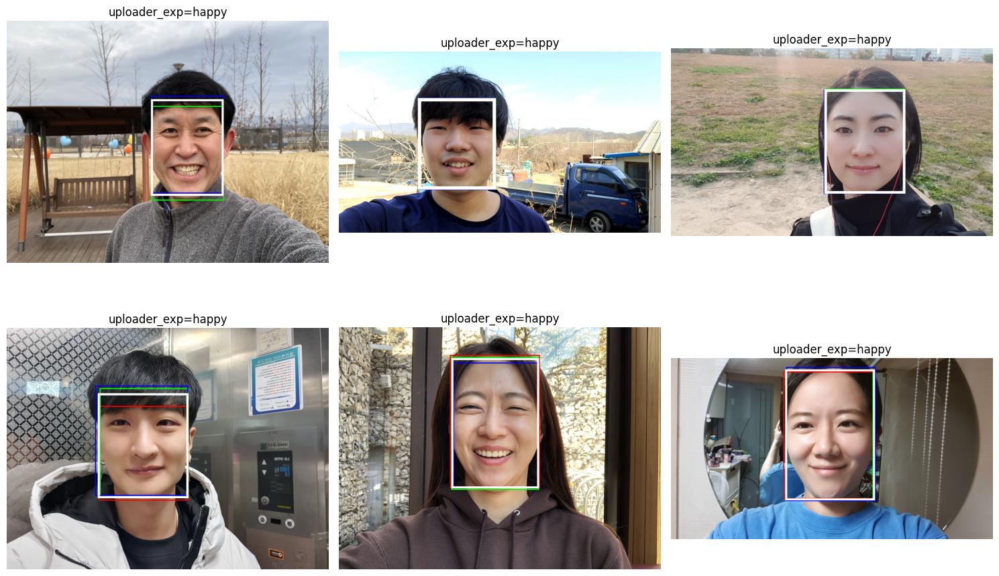

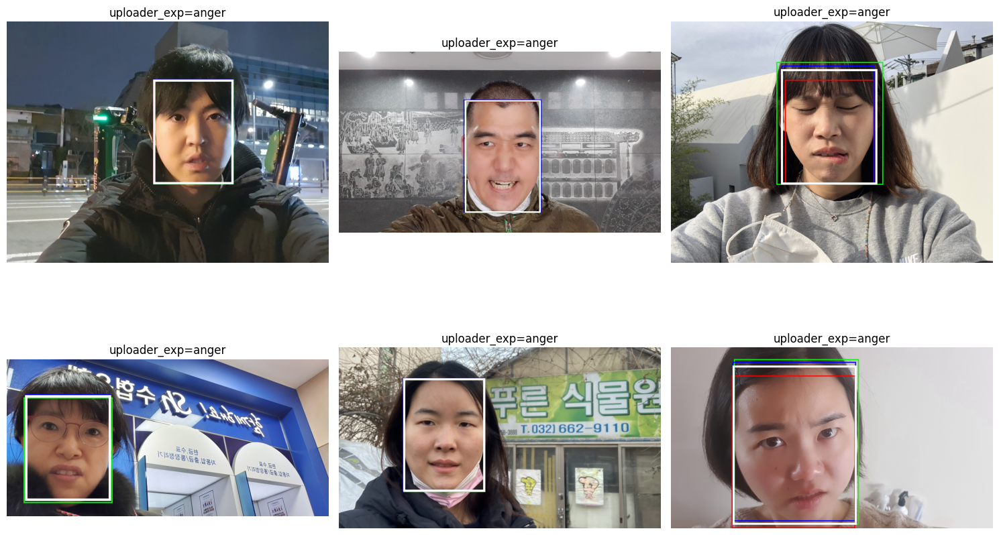

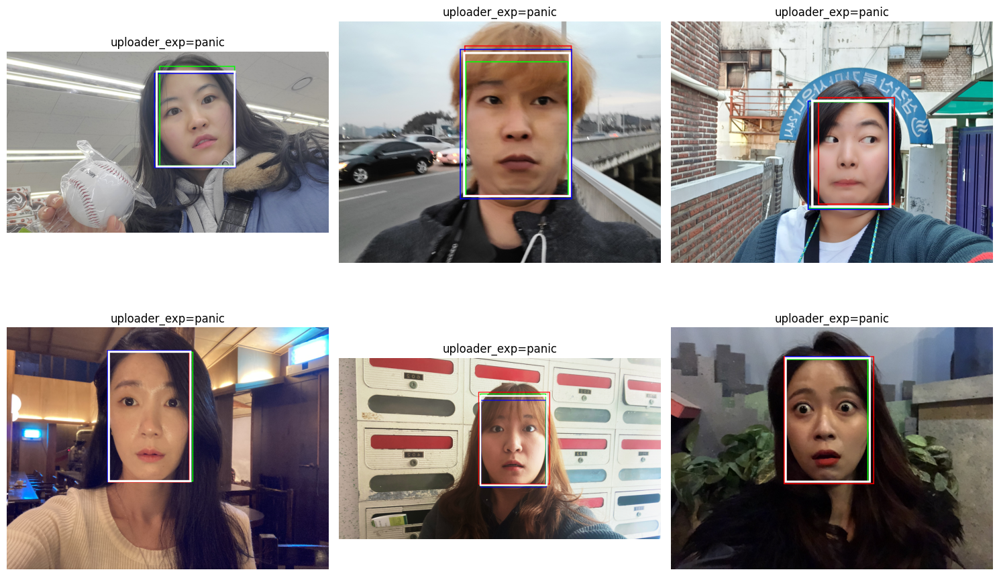

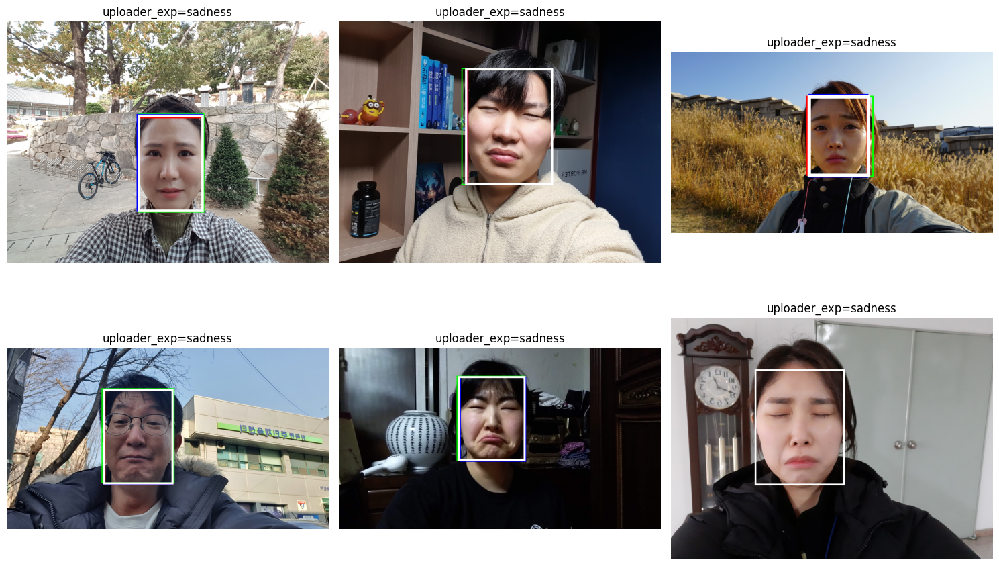

In [20]:
# 1) 샘플 이미지 5~10장, 박스 오버레이
def show_samples_with_bboxes(target_split='label_train', target_class=None, n=6):
    # target_class가 None이면 전체에서 샘플
    df = label_long_df[label_long_df['split']==target_split].copy()
    if target_class is not None:
        # annotator의 faceExp 또는 업로더 기반으로 필터링: 여기서는 업로더 기준 예시
        df = df[df['uploader_faceExp']==target_class]
    # 파일당 1개로 축약
    df_unique = df.drop_duplicates(subset=['filename']).head(n)
    if df_unique.empty:
        print(f'No samples for {target_split}, class={target_class}')
        return

    ncols = 3
    nrows = int(np.ceil(len(df_unique)/ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 5*nrows))
    axes = axes.ravel() if hasattr(axes, 'ravel') else [axes]

    # annotator별 색상 및 선 굵기 지정
    annot_colors = {'annot_A': (255,0,0), 'annot_B': (0,255,0), 'annot_C': (0,0,255)} # R, G, B
    # annot_widths = {'annot_A': 10, 'annot_B': 6, 'annot_C': 4}

    for ax, (_, row) in zip(axes, df_unique.iterrows()):
        img_path = find_image_path(row['filename'])
        if img_path is None:
            ax.set_title(f"Missing image: {row['filename']}")
            ax.axis('off')
            continue
        img = Image.open(img_path)
        img = correct_image_orientation(img) # exif 정보를 읽어 이미지 정방향으로
        img = img.convert('RGB')

        # annot_A/B/C 박스 모두 표시
        bboxes = []
        for annot in ['annot_A', 'annot_B', 'annot_C']:
            ann_row = label_long_df[
                (label_long_df['filename']==row['filename']) &
                (label_long_df['split']==row['split']) &
                (label_long_df['annotator']==annot)
            ]
            if not ann_row.empty:
                r = ann_row.iloc[0]
                bbox = (r['minX'], r['minY'], r['maxX'], r['maxY'])
                bboxes.append(bbox)
                color = annot_colors[annot]
                img = draw_bbox_on_image(img, bbox, color=color, width=10)

        # 평균 박스(흰색, 두께 20)
        if len(bboxes) == 3:
            minX = np.mean([b[0] for b in bboxes])
            minY = np.mean([b[1] for b in bboxes])
            maxX = np.mean([b[2] for b in bboxes])
            maxY = np.mean([b[3] for b in bboxes])
            mean_bbox = (minX, minY, maxX, maxY)
            img = draw_bbox_on_image(img, mean_bbox, color=(255,255,255), width=20)


        ax.imshow(img)
        # 한글 감정명을 영어로 변환
        emo = row.get('uploader_faceExp')
        eng_emo = emotion_map.get(emo, emo)
        ax.set_title(f"uploader_exp={eng_emo}")
        ax.axis('off')

    for ax in axes[len(df_unique):]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# 예시 실행
show_samples_with_bboxes('label_train', target_class='기쁨', n=6)
show_samples_with_bboxes('label_train', target_class='분노', n=6)
show_samples_with_bboxes('label_train', target_class='당황', n=6)
show_samples_with_bboxes('label_train', target_class='슬픔', n=6)

In [36]:
print(find_image_path('6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63ec1162f5f6bfc6e481l.jpg'))
print(find_seg_path('6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63ec1162f5f6bfc6e481l.jpg', 'seg_train'))

./Data/EST_data/img_train/anger/6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63ec1162f5f6bfc6e481l.jpg
None


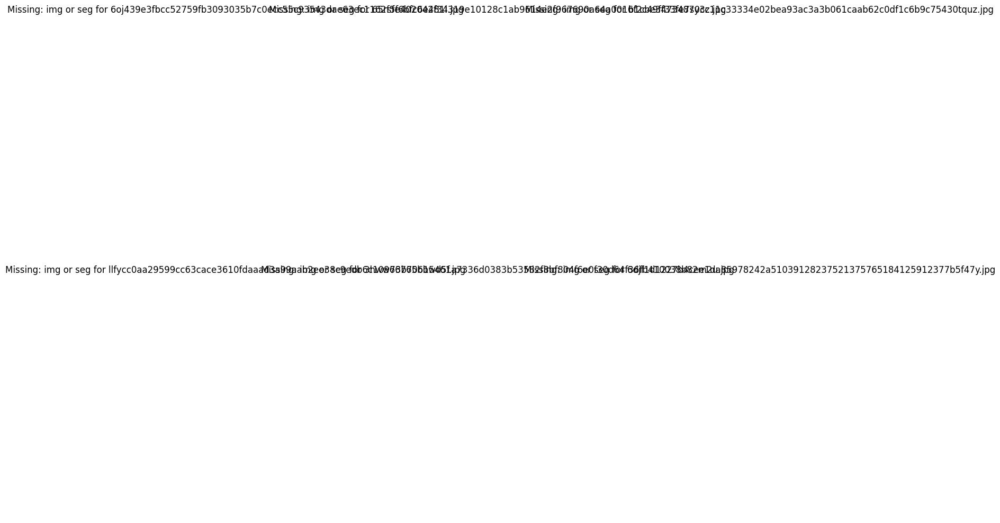

In [24]:
# 2) 세그멘테이션 마스크 시각화 + 비율 계산
def show_seg_overlay_and_ratios(target_split='label_train', n=6):
    df = label_long_df[label_long_df['split']==target_split].drop_duplicates(subset=['filename']).head(n)
    if df.empty:
        print(f'No samples for {target_split}')
        return

    ncols = 3
    nrows = int(np.ceil(len(df)/ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 5*nrows))
    axes = axes.ravel() if hasattr(axes, 'ravel') else [axes]

    # 대응 seg split
    seg_split = target_split.replace('label_', 'seg_')

    for ax, (_, row) in zip(axes, df.iterrows()):
        img_path = find_image_path(row['filename'])
        seg_path = find_seg_path(row['filename'], seg_split)

        if img_path is None or seg_path is None:
            ax.set_title(f"Missing: img or seg for {row['filename']}")
            ax.axis('off')
            continue

        img = Image.open(img_path) 
        img = correct_image_orientation(img) # exif 정보를 읽어 이미지 정방향으로
        img = img.convert('RGB')
        seg = load_seg_mask(seg_path)

        blended = overlay_segmentation(img, seg)
        ax.imshow(blended)
        ratios = compute_seg_ratios(seg)
        txt = ', '.join([f"{k}:{ratios[k]*100:.1f}%" for k in ['face','hair','cloth','background'] if k in ratios and ratios[k] is not None])
        ax.set_title(f"{row['filename']} | {txt}")
        ax.axis('off')

    for ax in axes[len(df):]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# 예시 실행
show_seg_overlay_and_ratios('label_train', n=6)

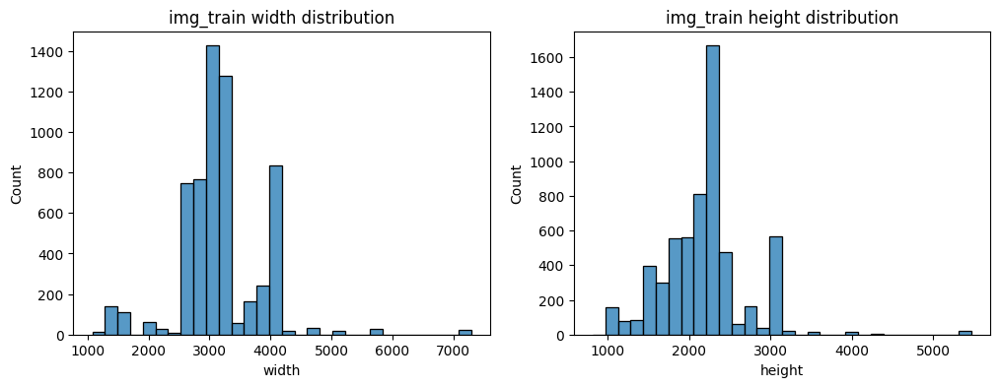

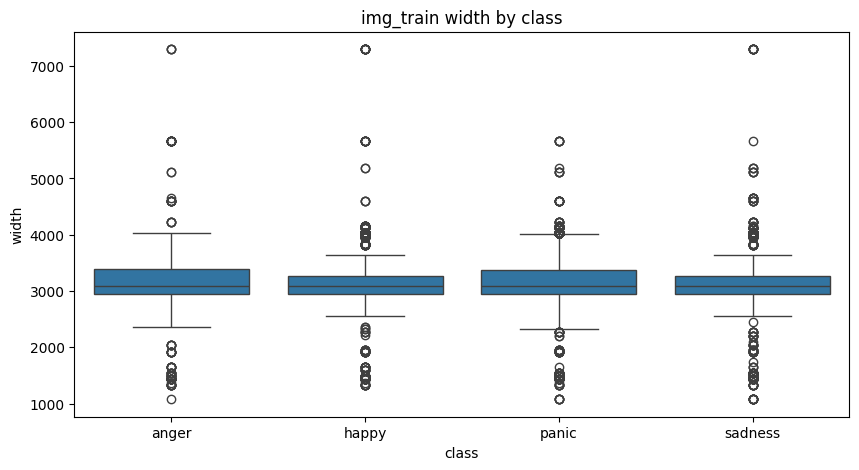

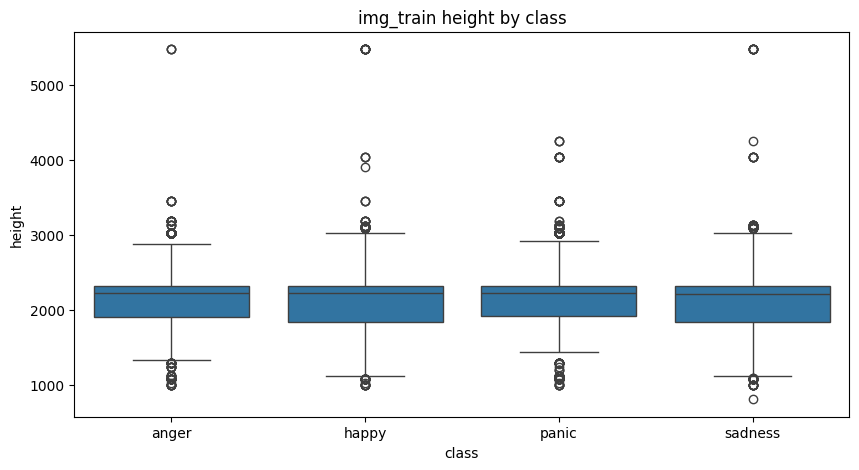

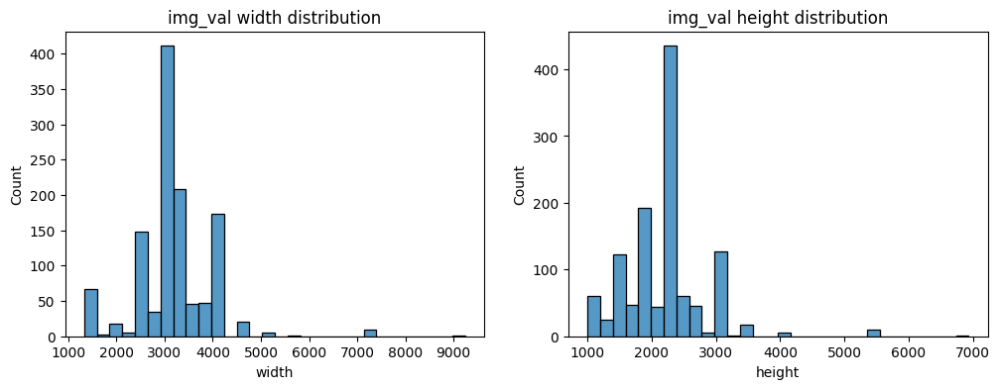

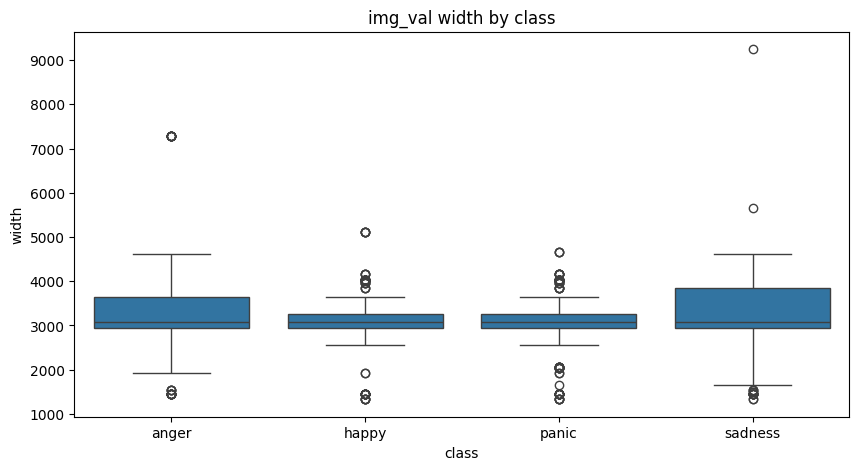

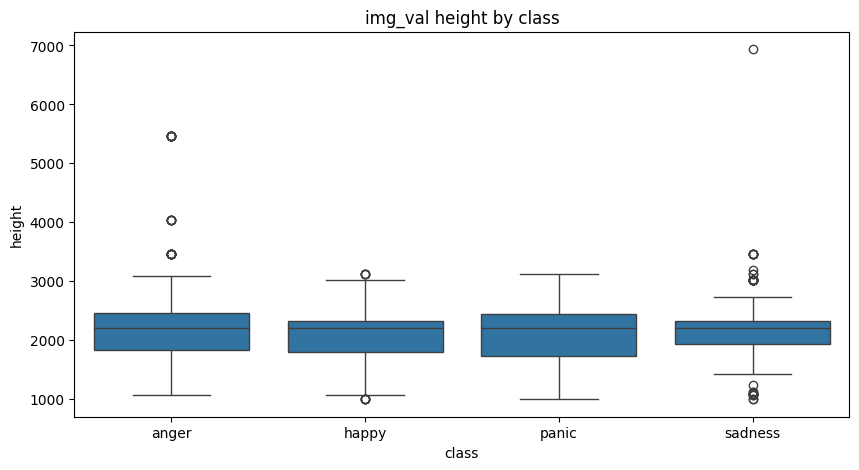

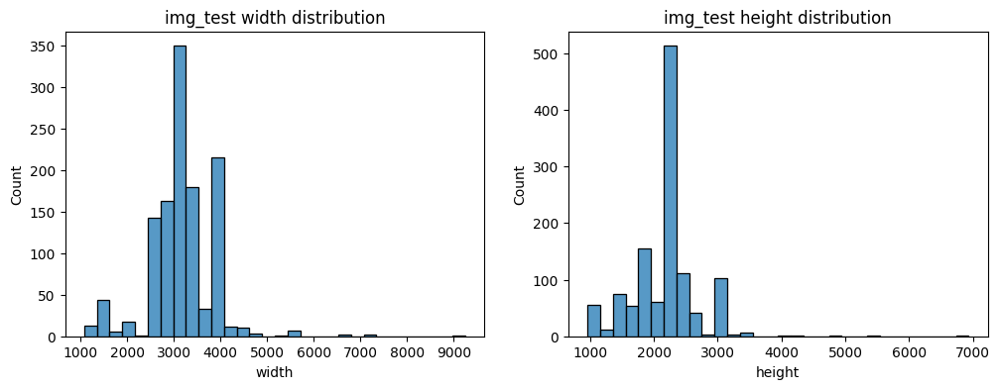

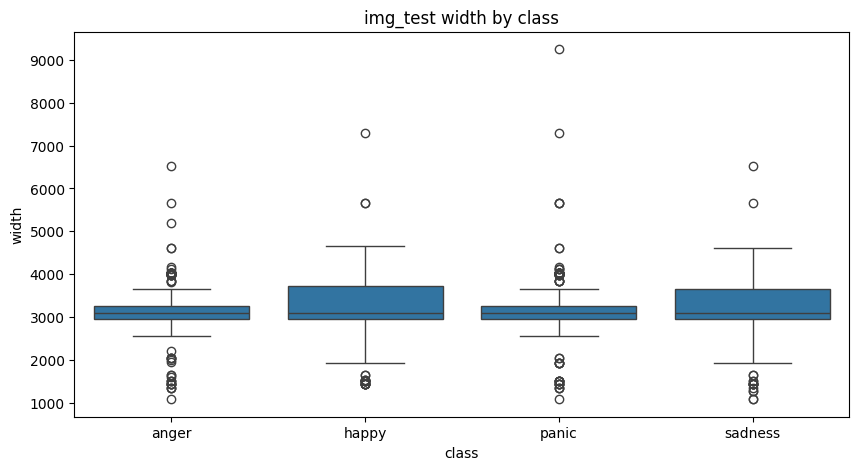

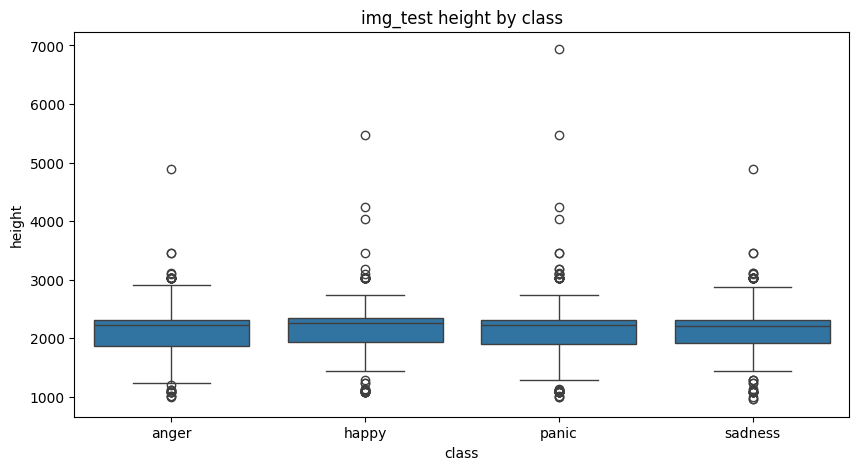

In [25]:
# 3) 이미지 해상도/파일 크기 분포
def image_size_distribution(split='img_train'):
    sizes = []
    file_sizes = []
    for cls in CLASSES:
        cls_dir = os.path.join(BASE_DIR, split, cls)
        if not os.path.isdir(cls_dir):
            continue
        for p in glob.glob(os.path.join(cls_dir, '*')):
            if os.path.isfile(p) and p.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.webp')):
                try:
                    with Image.open(p) as im:
                        w, h = im.size
                    sizes.append({'class': cls, 'width': w, 'height': h, 'split': split})
                    file_sizes.append(os.path.getsize(p))
                except Exception as e:
                    pass
    if not sizes:
        print(f'No images for {split}')
        return
    df = pd.DataFrame(sizes)
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    sns.histplot(df['width'], bins=30, ax=axes[0], kde=False)
    axes[0].set_title(f'{split} width distribution')
    sns.histplot(df['height'], bins=30, ax=axes[1], kde=False)
    axes[1].set_title(f'{split} height distribution')
    plt.show()

    # 클래스별 사이즈 경향
    plt.figure(figsize=(10,5))
    sns.boxplot(data=df, x='class', y='width')
    plt.title(f'{split} width by class')
    plt.show()

    plt.figure(figsize=(10,5))
    sns.boxplot(data=df, x='class', y='height')
    plt.title(f'{split} height by class')
    plt.show()

# 예시 실행
image_size_distribution('img_train')
image_size_distribution('img_val')
image_size_distribution('img_test')

# (C) 라벨 품질 및 어노테이터 분석


[감정 라벨 일치율 요약]
              count      mean       std       min       25%  50%  75%  max
split                                                                     
label_test   1200.0  0.842222  0.218067  0.333333  0.666667  1.0  1.0  1.0
label_train  5994.0  0.837727  0.221968  0.333333  0.666667  1.0  1.0  1.0
label_val    1200.0  0.841944  0.218078  0.333333  0.666667  1.0  1.0  1.0


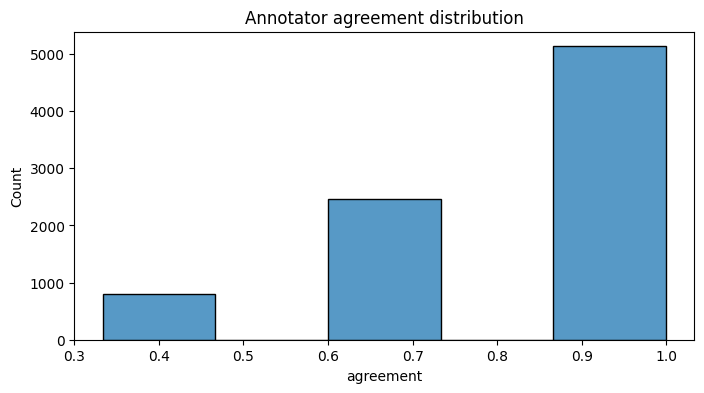


[업로더 라벨 vs annotators 일치율(파일별 평균)]
              count      mean       std  min       25%  50%  75%  max
split                                                                
label_test   1200.0  0.770833  0.324431  0.0  0.666667  1.0  1.0  1.0
label_train  5994.0  0.771549  0.320736  0.0  0.666667  1.0  1.0  1.0
label_val    1200.0  0.757778  0.334630  0.0  0.666667  1.0  1.0  1.0


In [37]:
# 1) 감정 라벨 일치율 (3명 annotator)
def agreement_rate(df_long):
    """filename 단위로 3 annotator faceExp 일치율 계산"""
    rates = []
    for (split, filename), g in df_long.groupby(['split','filename']):
        labels = g['faceExp'].dropna().tolist()
        if len(labels) < 2:
            continue
        # 일치율: majority voting 비율
        vc = pd.Series(labels).value_counts()
        majority = vc.max()
        total = len(labels)
        rate = majority / total
        rates.append({'split': split, 'filename': filename, 'n_labels': total, 'majority': vc.idxmax(), 'agreement': rate})
    return pd.DataFrame(rates)

if not label_long_df.empty:
    agree_df = agreement_rate(label_long_df)
    print('\n[감정 라벨 일치율 요약]')
    if not agree_df.empty:
        print(agree_df.groupby('split')['agreement'].describe())
        plt.figure(figsize=(8,4))
        sns.histplot(agree_df['agreement'], bins=5)
        plt.title('Annotator agreement distribution')
        plt.show()

# 업로더 라벨과의 차이 비율
if not label_long_df.empty and 'uploader_faceExp' in label_long_df.columns:
    comp = label_long_df[['split','filename','annotator','faceExp','uploader_faceExp']].dropna()
    comp['match'] = (comp['faceExp'] == comp['uploader_faceExp']).astype(int)
    uploader_match = (comp.groupby(['split','filename'])['match'].mean().reset_index()
                      .rename(columns={'match':'uploader_match_rate'}))
    print('\n[업로더 라벨 vs annotators 일치율(파일별 평균)]')
    print(uploader_match.groupby('split')['uploader_match_rate'].describe())


[배경 라벨 일치율 요약]
              count      mean       std       min       25%  50%  75%  max
split                                                                     
label_test   1200.0  0.845278  0.205219  0.333333  0.666667  1.0  1.0  1.0
label_train  5994.0  0.851629  0.205350  0.333333  0.666667  1.0  1.0  1.0
label_val    1200.0  0.843333  0.204871  0.333333  0.666667  1.0  1.0  1.0


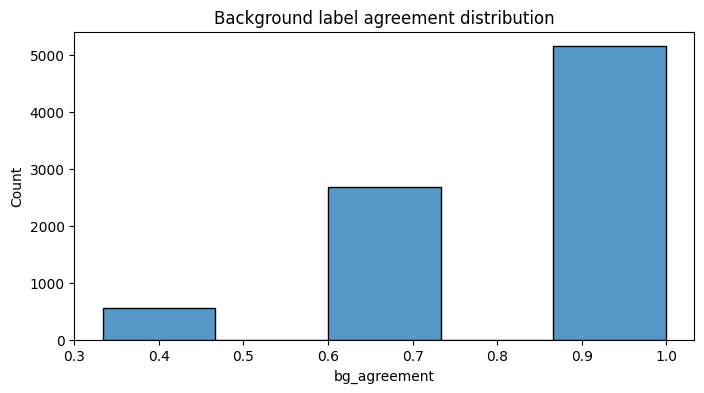


[바운딩 박스 통계 요약]


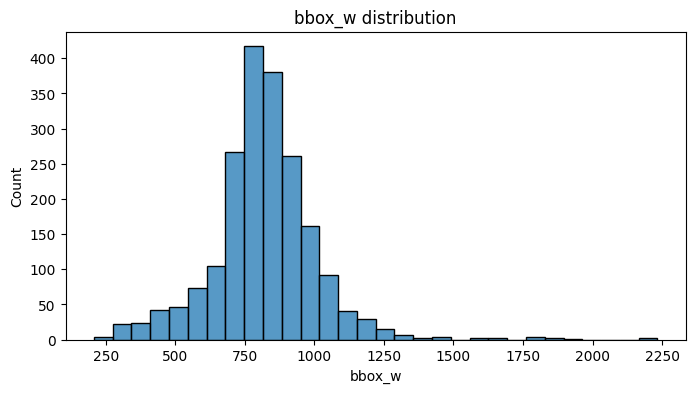

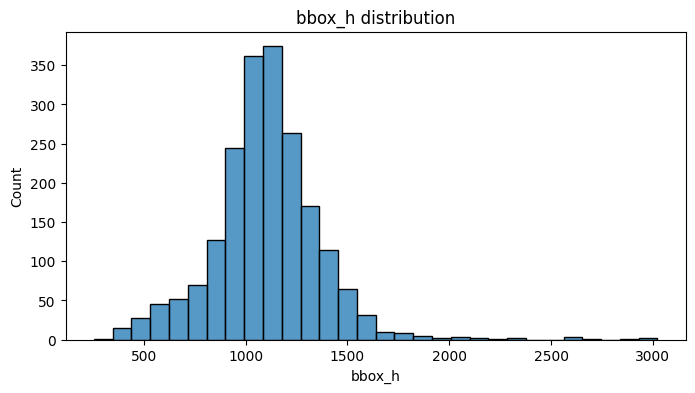

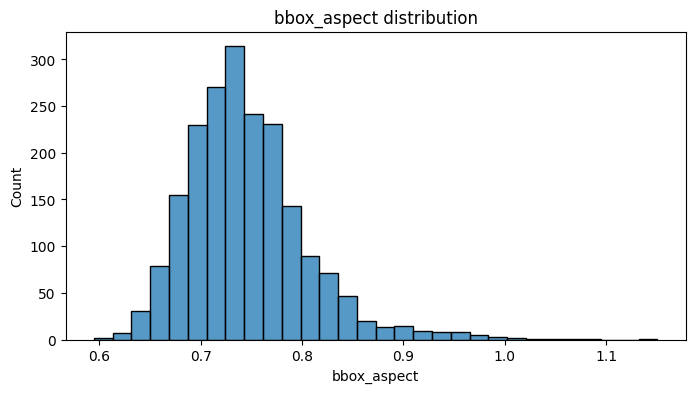

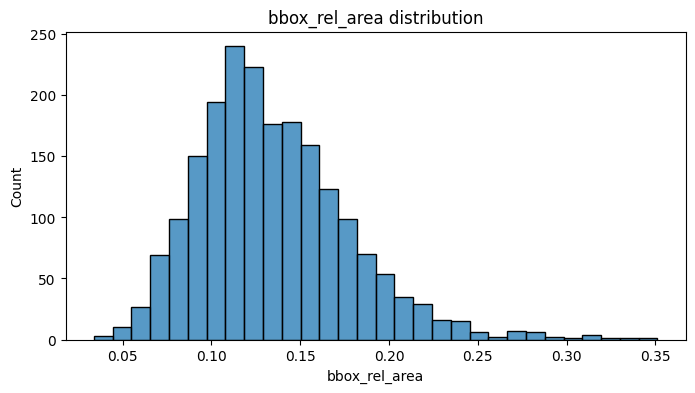

/home/hys/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 48520 (\N{HANGUL SYLLABLE BUL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hys/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 50504 (\N{HANGUL SYLLABLE AN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hys/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 49345 (\N{HANGUL SYLLABLE SANG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hys/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 52376 (\N{HANGUL SYLLABLE CEO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hys/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 44592 (\N{HANGUL SYLLABLE GI}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figu

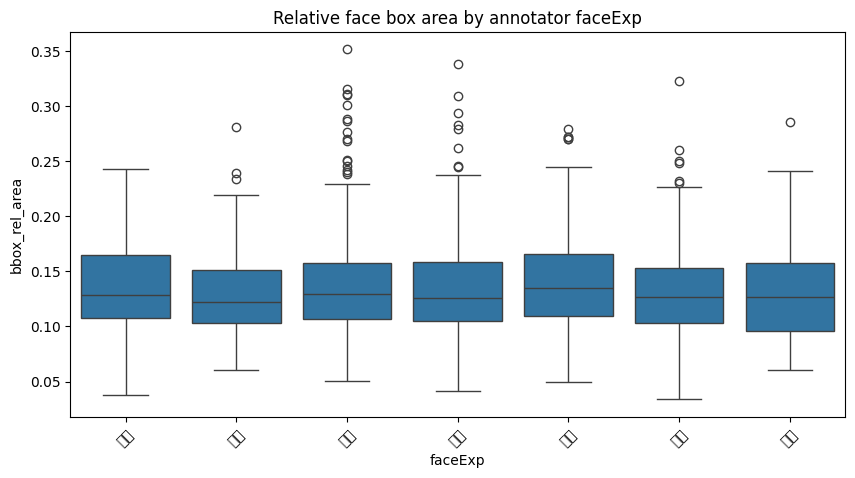


[바운딩 박스 이상치 요약]
         split                                           filename annotator  \
0  label_train  9rzj2ff6822f42cef0544243362f0f4f2e08fdffff9a74...   annot_A   
1  label_train  9rzj2ff6822f42cef0544243362f0f4f2e08fdffff9a74...   annot_B   
2  label_train  9rzj2ff6822f42cef0544243362f0f4f2e08fdffff9a74...   annot_C   
3  label_train  fper3db11fef98f236117e11df9f5ad4a93e1c9bf2172b...   annot_B   
4  label_train  0hee6d13b154caa765569e2307f0c1b16e7fe9f072eef1...   annot_A   

  faceExp  rel_area  out_of_bounds  too_small  too_big  
0      분노  0.111697           True      False    False  
1      분노  0.111778           True      False    False  
2      분노  0.113497           True      False    False  
3      분노  0.000216          False       True    False  
4      분노  0.244065           True      False    False  
총 이상치 수: 250

[세그-박스 불일치 사례]
Empty DataFrame
Columns: []
Index: []


In [38]:

# 2) 배경 라벨 일치율
if not label_long_df.empty:
    bg_comp = label_long_df[['split','filename','annotator','bg']].dropna()
    rates = []
    for (split, filename), g in bg_comp.groupby(['split','filename']):
        labels = g['bg'].tolist()
        vc = pd.Series(labels).value_counts()
        rate = vc.max()/len(labels) if len(labels)>0 else np.nan
        rates.append({'split':split, 'filename':filename, 'bg_agreement': rate})
    bg_agree_df = pd.DataFrame(rates)
    print('\n[배경 라벨 일치율 요약]')
    if not bg_agree_df.empty:
        print(bg_agree_df.groupby('split')['bg_agreement'].describe())
        plt.figure(figsize=(8,4))
        sns.histplot(bg_agree_df['bg_agreement'], bins=5)
        plt.title('Background label agreement distribution')
        plt.show()

# 3) 바운딩 박스 통계 (너비/높이/비율/상대면적)
def bbox_stats(df_long, sample_limit=2000):
    rows = []
    # 이미지 크기 가져오려면 파일 열어야 함 -> 비용 때문에 샘플링
    sampled = df_long.dropna(subset=BOX_KEYS).sample(min(sample_limit, len(df_long)), random_state=42) if len(df_long)>0 else df_long
    for _, r in sampled.iterrows():
        img_path = find_image_path(r['filename'])
        if img_path is None:
            continue
        try:
            with Image.open(img_path) as im:
                w, h = im.size
        except:
            continue
        bw, bh, area, aspect, rel_area = bbox_size_and_ratio(r['minX'], r['maxX'], r['minY'], r['maxY'], w, h)
        rows.append({
            'split': r['split'],
            'filename': r['filename'],
            'annotator': r['annotator'],
            'faceExp': r['faceExp'],
            'bbox_w': bw, 'bbox_h': bh, 'bbox_area': area, 'bbox_aspect': aspect, 'bbox_rel_area': rel_area
        })
    return pd.DataFrame(rows)

if not label_long_df.empty:
    bbox_df = bbox_stats(label_long_df)
    print('\n[바운딩 박스 통계 요약]')
    if not bbox_df.empty:
        for col in ['bbox_w','bbox_h','bbox_aspect','bbox_rel_area']:
            plt.figure(figsize=(8,4))
            sns.histplot(bbox_df[col].dropna(), bins=30)
            plt.title(f'{col} distribution')
            plt.show()

        # 감정과 박스 크기/위치 상관(여기서는 크기/비율만 예시)
        plt.figure(figsize=(10,5))
        sns.boxplot(data=bbox_df, x='faceExp', y='bbox_rel_area')
        plt.title('Relative face box area by annotator faceExp')
        plt.xticks(rotation=45)
        plt.show()

# 4) 이상치 탐지
# - 극단적으로 작은/큰 박스, 이미지 경계 밖 박스, seg와 불일치
def find_bbox_outliers(df_long, min_rel_area=0.001, max_rel_area=0.8):
    issues = []
    for _, r in df_long.dropna(subset=BOX_KEYS).iterrows():
        img_path = find_image_path(r['filename'])
        if img_path is None:
            continue
        try:
            with Image.open(img_path) as im:
                w, h = im.size
        except:
            continue
        bw, bh, area, aspect, rel_area = bbox_size_and_ratio(r['minX'], r['maxX'], r['minY'], r['maxY'], w, h)
        # 경계 밖 여부
        out_of_bounds = (r['minX']<0) or (r['minY']<0) or (r['maxX']>w) or (r['maxY']>h)
        too_small = (rel_area is not None) and (not np.isnan(rel_area)) and (rel_area < min_rel_area)
        too_big = (rel_area is not None) and (not np.isnan(rel_area)) and (rel_area > max_rel_area)
        if out_of_bounds or too_small or too_big:
            issues.append({
                'split': r['split'],
                'filename': r['filename'],
                'annotator': r['annotator'],
                'faceExp': r['faceExp'],
                'rel_area': rel_area,
                'out_of_bounds': out_of_bounds,
                'too_small': too_small,
                'too_big': too_big
            })
    return pd.DataFrame(issues)

if not label_long_df.empty:
    outliers_df = find_bbox_outliers(label_long_df)
    print('\n[바운딩 박스 이상치 요약]')
    if not outliers_df.empty:
        print(outliers_df.head())
        print('총 이상치 수:', len(outliers_df))

# seg와 박스 불일치(얼굴 박스 안에 face 픽셀이 거의 없는 경우 등) 탐지 예시
def face_mask_mismatch_examples(df_long, target_split='label_val', sample_k=50, face_thresh=0.05):
    cand = df_long[(df_long['split']==target_split) & (df_long['annotator']=='annot_A')].dropna(subset=BOX_KEYS)
    cand = cand.sample(min(len(cand), sample_k), random_state=0)
    seg_split = target_split.replace('label_','seg_')
    mismatches = []
    for _, r in cand.iterrows():
        img_path = find_image_path(r['filename'])
        seg_path = find_seg_path(r['filename'], seg_split)
        if img_path is None or seg_path is None:
            continue
        with Image.open(img_path) as im:
            w, h = im.size
        seg = load_seg_mask(seg_path)
        # 크기 맞추기
        if seg.shape[1] != w or seg.shape[0] != h:
            from PIL import Image as PILImage
            seg_img = PILImage.fromarray(seg.astype(np.uint8))
            seg_img = seg_img.resize((w, h), resample=PILImage.NEAREST)
            seg = np.array(seg_img)

        x0, y0, x1, y1 = int(r['minX']), int(r['minY']), int(r['maxX']), int(r['maxY'])
        x0, y0 = max(0, x0), max(0, y0)
        x1, y1 = min(w, x1), min(h, y1)
        if x1<=x0 or y1<=y0:
            continue
        crop = seg[y0:y1, x0:x1]
        face_ratio = (crop==3).mean() if crop.size>0 else 0.0
        if face_ratio < face_thresh:
            mismatches.append({'filename': r['filename'], 'face_ratio_in_box': face_ratio})
    return pd.DataFrame(mismatches)

# 예시 실행
mm_df = face_mask_mismatch_examples(label_long_df, target_split='label_val', sample_k=80, face_thresh=0.05)
print('\n[세그-박스 불일치 사례]')
print(mm_df.head())
